In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import itertools as it

sns.set_style('white')

from metamds.db import query_sim, retrieve_all, update_doc
from block_avg import block_average

In [2]:
cursor = retrieve_all()
cursor_2 = retrieve_all(collection="peg_oxy_cap")
forces = dict()
cof = dict()
nf = dict()

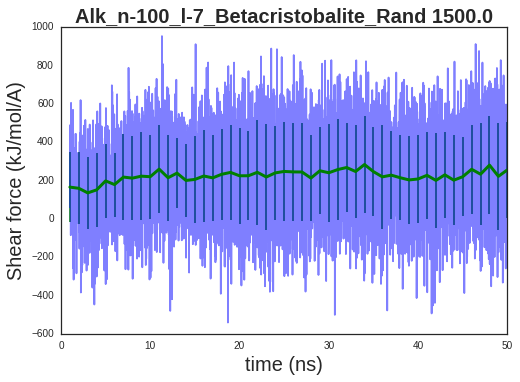

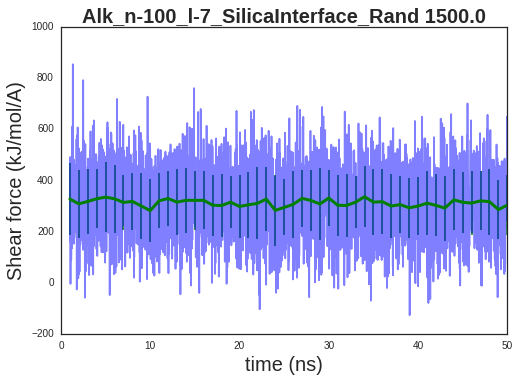

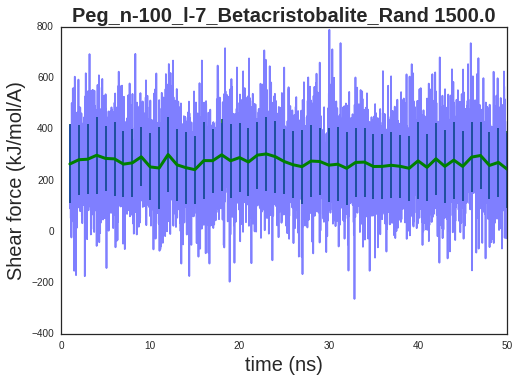

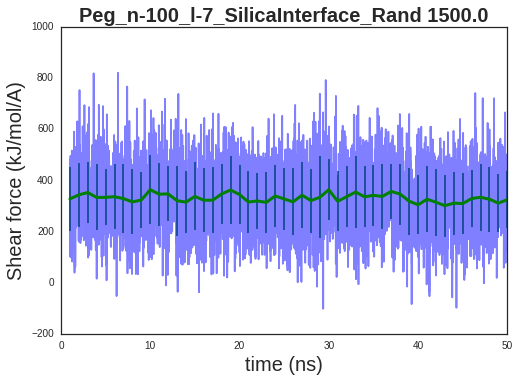

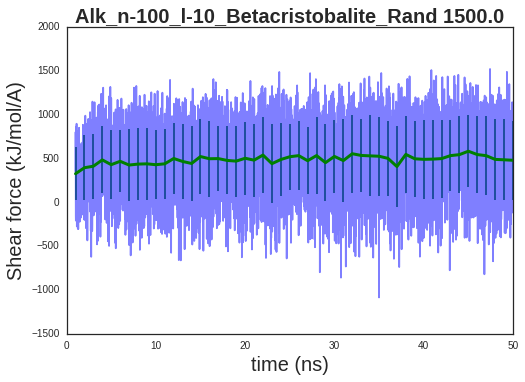

...

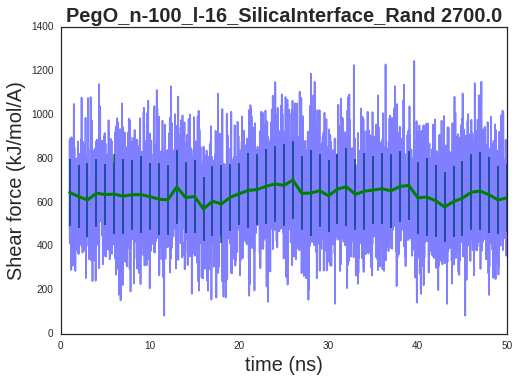

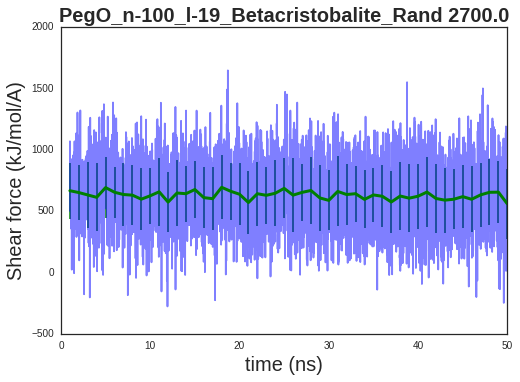

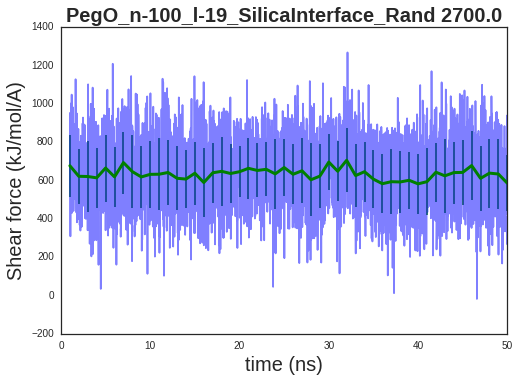

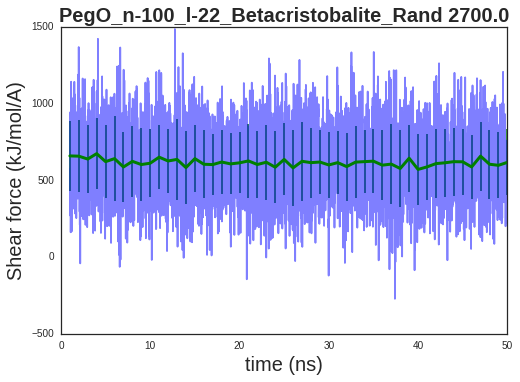

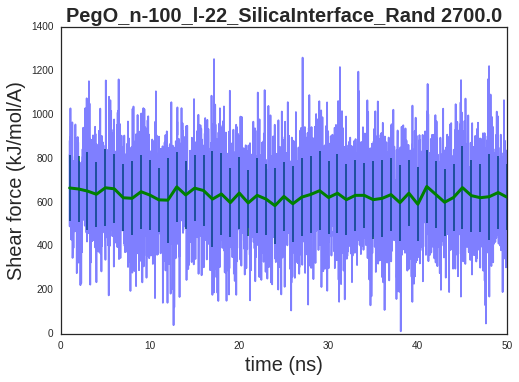

In [3]:
for doc in it.chain(cursor, cursor_2):

    polymer = doc['polymer_class']
    n_molecules = doc ['n_molecules']
    chain_length = doc['chain_length']
    surface = doc['surface_class']
    pattern = doc['pattern_class']
    normal_force = doc['normal_force(kJ/mol/A)']
    name = doc['name']
    fric = doc['friction']
    last_time = doc['last_time']

    name_nf = "{}_{}".format(name, normal_force)

    time, results = block_average(np.linspace(1000.0, last_time, len(fric)) / 1000, 
                                  50, fric)
    

    nf[name_nf] = dict()
    nf[name_nf][normal_force] = dict()
    cof[name_nf] = dict()
    cof[name_nf][chain_length] = dict()

    nf[name_nf][normal_force]['shear_force'] = np.mean(results[0])
    nf[name_nf][normal_force]['shear_force_std'] = np.std(results[0])
    nf[name_nf][normal_force]['cof'] = np.mean(results[0]) / (normal_force)
    nf[name_nf][normal_force]['cof_std'] = np.std(results[0]) / (normal_force)
    cof[name_nf][chain_length]['shear_force'] = np.mean(results[0])
    cof[name_nf][chain_length]['shear_force_std'] = np.std(results[0])
    cof[name_nf][chain_length]['cof'] = np.mean(results[0]) / (normal_force)
    cof[name_nf][chain_length]['cof_std'] = np.std(results[0]) / (normal_force)
    

    #fric_nN = [item*0.0166 for item in fric]
    fric_nN = fric
    time, results = block_average(np.linspace(1000.0, last_time, len(fric_nN)) / 1000, 
                                  50, fric_nN)
    plt.plot(np.linspace(1000.0, last_time, len(fric)) / 1000, fric_nN, alpha=0.5, c='b')
    plt.xlabel('time (ns)', size=20)
    plt.ylabel('Shear force (kJ/mol/A)', size=20)
    plt.errorbar(time, results[0], yerr=results[1],
                 ls='-', label='', c='g', lw=3.0, elinewidth=1.5)
    plt.title("{} {}".format(name, normal_force), size=20, weight='bold')
    plt.show()
    plt.clf()

# Shear Force Plots

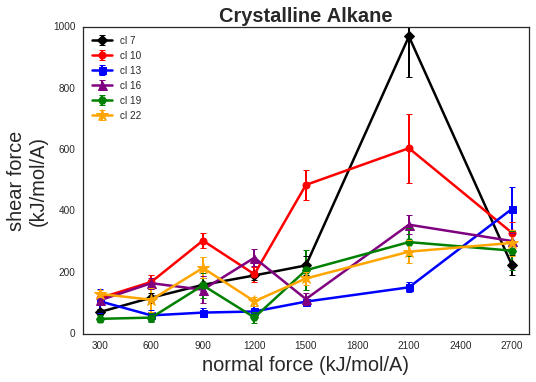

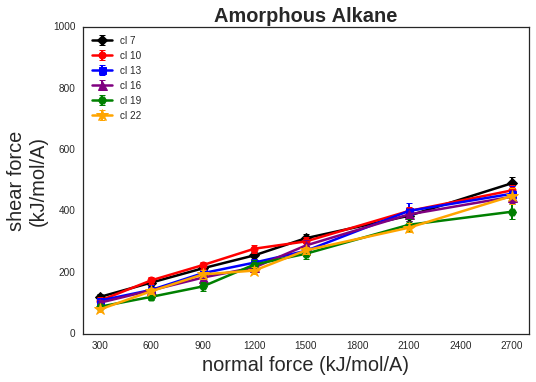

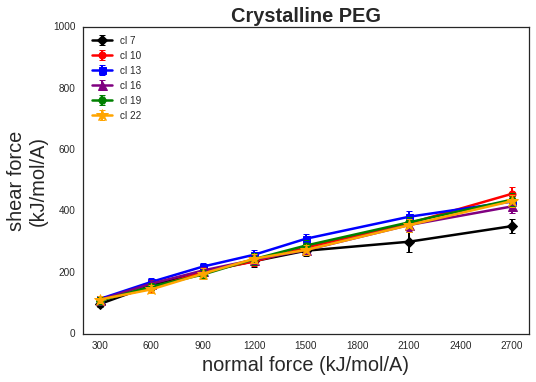

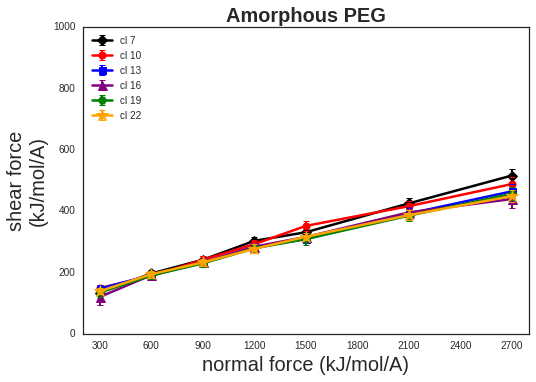

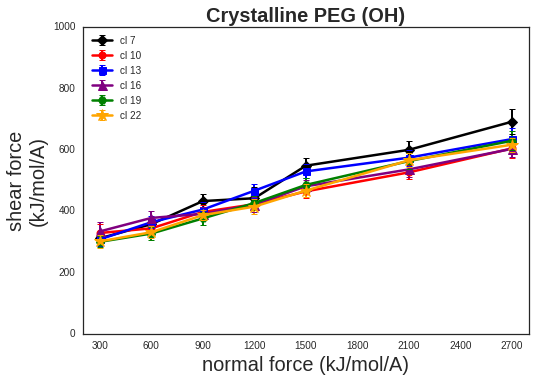

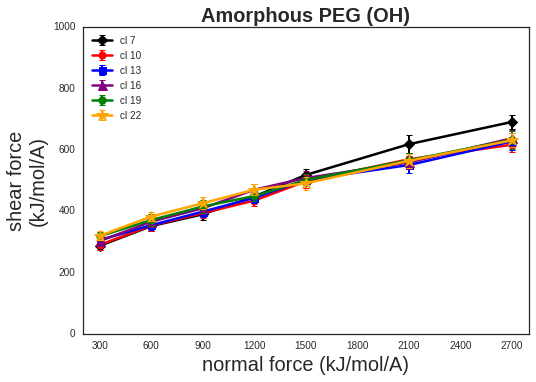

In [11]:
chain_lengths = np.array([7, 10, 13, 16, 19, 22])
cl_array_len = len(chain_lengths)
normal_forces = np.array([0300.0, 0600.0, 0900.0, 1200.0, 1500.0, 2100.0, 2700.0])
nf_array_len = len(normal_forces)

from scipy import stats
from pprint import pprint
import itertools as it

polymers = ["Alk", "Peg_", "PegO"]
surfaces = ["Betacristobalite", "SilicaInterface"]

seven = np.zeros(nf_array_len)
ten = np.zeros(nf_array_len)
thirteen = np.zeros(nf_array_len)
sixteen = np.zeros(nf_array_len)
nineteen = np.zeros(nf_array_len)
twentytwo = np.zeros(nf_array_len)
seven_err = np.zeros(nf_array_len)
ten_err = np.zeros(nf_array_len)
thirteen_err = np.zeros(nf_array_len)
sixteen_err = np.zeros(nf_array_len)
nineteen_err = np.zeros(nf_array_len)
twentytwo_err = np.zeros(nf_array_len)

lines = [seven, ten, thirteen, sixteen, nineteen, twentytwo]

for polymer, surface in it.product(polymers, surfaces):
    for i in range(nf_array_len):
        seven[i] = [x[7]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 7 in x.keys()][0]
        seven_err[i] = [x[7]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 7 in x.keys()][0]
        ten[i] = [x[10]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 10 in x.keys()][0]
        ten_err[i] = [x[10]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 10 in x.keys()][0]
        thirteen[i] = [x[13]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 13 in x.keys()][0]
        thirteen_err[i] = [x[13]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 13 in x.keys()][0]
        sixteen[i] = [x[16]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 16 in x.keys()][0]
        sixteen_err[i] = [x[16]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 16 in x.keys()][0]
        nineteen[i] = [x[19]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 19 in x.keys()][0]
        nineteen_err[i] = [x[19]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 19 in x.keys()][0]
        twentytwo[i] = [x[22]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 22 in x.keys()][0]
        twentytwo_err[i] = [x[22]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 22 in x.keys()][0]
        
    plt.errorbar(normal_forces, seven, yerr=seven_err, ls='-', elinewidth=2.0,
                 marker='D', label='cl 7', ms=7.0, lw=2.5, c='k', mew=1, mec='k')
    plt.errorbar(normal_forces, ten, yerr=ten_err, ls='-', elinewidth=2.0,
                 marker='o', label='cl 10', ms=7.0, lw=2.5, c='r', mew=1, mec='r')
    plt.errorbar(normal_forces, thirteen, yerr=thirteen_err, ls='-', elinewidth=2.0,
                 marker='s', label='cl 13', ms=7.0, lw=2.5, c='b', mew=1, mec='b')
    plt.errorbar(normal_forces, sixteen, yerr=sixteen_err, ls='-', elinewidth=2.0,
                 marker='^', label='cl 16', ms=9.0, lw=2.5, c='purple', mew=1, mec='purple')
    plt.errorbar(normal_forces, nineteen, yerr=nineteen_err, ls='-', elinewidth=2.0,
                 marker='H', label='cl 19', ms=8.0, lw=2.5, c='g', mew=1, mec='g')
    plt.errorbar(normal_forces, twentytwo, yerr=twentytwo_err, ls='-', elinewidth=2.0,
                 marker='*', label='cl 22', ms=12.0, lw=2.5, c='orange', mew=1, mec='orange')
    
    name = "{}_{}".format(polymer, surface)
    cof[name]=dict()
   
    for i in range(cl_array_len):
        slope, intercept, r_value, p_value, std_err = stats.linregress(normal_forces, lines[i])    
        cof[name][chain_lengths[i]] = [slope, std_err]
        #print("cl:{5:3d}, slope:{0:>6.3f}, int:{1:>8.3f}, r:{2:>6.3f}, p:{3:>6.3f}, std_err:{4:>6.3f}".format(slope, intercept, r_value, p_value, std_err, chain_lengths[i]))
    
    if surface == "Betacristobalite":
        structure = 'Crystalline'
    else:
        structure = "Amorphous"
    if polymer == "Alk":
        polymer_name = "Alkane"
    elif polymer == "PegO":
        polymer_name = "PEG (OH)"
    else:
        polymer_name = "PEG"

    plt.xlabel('normal force (kJ/mol/A)', size=20)
    xticks=[300, 600, 900, 1200, 1500, 1800, 2100, 2400, 2700]
    plt.xticks(xticks)
    plt.xlim((200, 2800))
    
    plt.ylim((0, 1000))
    plt.ylabel('shear force\n(kJ/mol/A)', size=20)
    plt.legend(loc='upper left')
    
    plt.title("{} {}".format(structure, polymer_name), size=20, weight='bold')
    plt.show()
    plt.clf()

# COF vs Chain length

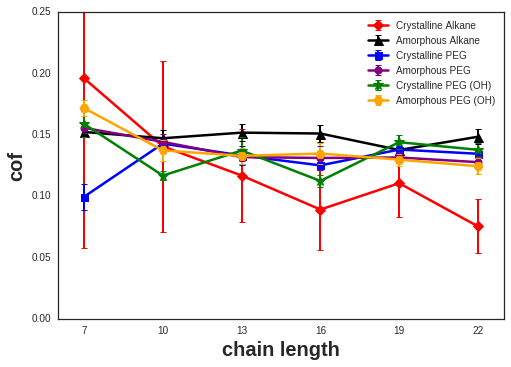

In [12]:
AC = np.zeros(cl_array_len)
AA = np.zeros(cl_array_len)
PC = np.zeros(cl_array_len)
PA = np.zeros(cl_array_len)
AC_err = np.zeros(cl_array_len)
AA_err = np.zeros(cl_array_len)
PC_err = np.zeros(cl_array_len)
PA_err = np.zeros(cl_array_len)
POC = np.zeros(cl_array_len)
POA = np.zeros(cl_array_len)
POC_err = np.zeros(cl_array_len)
POA_err = np.zeros(cl_array_len)

names = ["Alk_Betacristobalite", "Alk_SilicaInterface", "Peg__Betacristobalite", "Peg__SilicaInterface", "PegO_Betacristobalite", "PegO_SilicaInterface"]

for i in range(cl_array_len):
    AC[i] = cof[names[0]][chain_lengths[i]][0]
    AA[i] = cof[names[1]][chain_lengths[i]][0]
    PC[i] = cof[names[2]][chain_lengths[i]][0]
    PA[i] = cof[names[3]][chain_lengths[i]][0]
    POC[i] = cof[names[4]][chain_lengths[i]][0]
    POA[i] = cof[names[5]][chain_lengths[i]][0]
    AC_err[i] = cof[names[0]][chain_lengths[i]][1]
    AA_err[i] = cof[names[1]][chain_lengths[i]][1]
    PC_err[i] = cof[names[2]][chain_lengths[i]][1]
    PA_err[i] = cof[names[3]][chain_lengths[i]][1]
    POC_err[i] = cof[names[4]][chain_lengths[i]][1]
    POA_err[i] = cof[names[5]][chain_lengths[i]][1]
    
names = ["Crystalline Alkane", "Amorphous Alkane", "Crystalline PEG", "Amorphous PEG", "Crystalline PEG (OH)", "Amorphous PEG (OH)"]

plt.errorbar(chain_lengths, AC, ls='-', yerr=AC_err, lw=2.5,
             marker='D', label=names[0], ms=7, c='r', mew=1, mec='r', elinewidth=2.0)
plt.errorbar(chain_lengths, AA, ls='-', yerr=AA_err, lw=2.5,
             marker='^', label=names[1], ms=9, c='k', mew=1, mec='k', elinewidth=2.0)
plt.errorbar(chain_lengths, PC, ls='-', yerr=PC_err, lw=2.5,
             marker='s', label=names[2], ms=7, c='b', mew=1, mec='b', elinewidth=2.0)
plt.errorbar(chain_lengths, PA, ls='-', yerr=PA_err, lw=2.5,
             marker='o', label=names[3], ms=7, c='purple', mew=1, mec='purple', elinewidth=2.0)
plt.errorbar(chain_lengths, POC, ls='-', yerr=POC_err, lw=2.5,
             marker='*', label=names[4], ms=10, c='g', mew=1, mec='g', elinewidth=2.0)
plt.errorbar(chain_lengths, POA, ls='-', yerr=POA_err, lw=2.5,
             marker='H', label=names[5], ms=9, c='orange', mew=1, mec='orange', elinewidth=2.0)

plt.xlabel('chain length', size=20, weight='bold')
plt.xticks(chain_lengths)
plt.xlim((6, 23))

plt.ylim((0, .25))
plt.ylabel('cof', size=20, weight='bold')
plt.legend(loc='upper right')

plt.title("")

plt.show()
plt.clf()

cl:  7, slope: 0.196, int:  18.923, r: 0.536, p: 0.215, std_err: 0.138
cl: 10, slope: 0.140, int: 127.984, r: 0.670, p: 0.099, std_err: 0.070
cl: 13, slope: 0.117, int: -16.320, r: 0.807, p: 0.028, std_err: 0.038
cl: 16, slope: 0.089, int:  86.962, r: 0.773, p: 0.041, std_err: 0.033
cl: 19, slope: 0.110, int:   8.883, r: 0.872, p: 0.010, std_err: 0.028
cl: 22, slope: 0.075, int:  86.493, r: 0.836, p: 0.019, std_err: 0.022


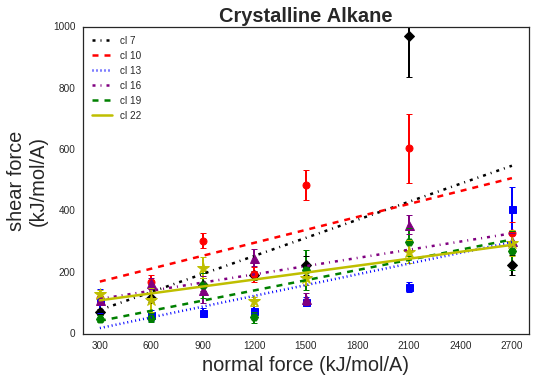

cl:  7, slope: 0.152, int:  75.391, r: 0.999, p: 0.000, std_err: 0.003
cl: 10, slope: 0.147, int:  83.465, r: 0.995, p: 0.000, std_err: 0.007
cl: 13, slope: 0.152, int:  56.788, r: 0.995, p: 0.000, std_err: 0.007
cl: 16, slope: 0.151, int:  51.788, r: 0.995, p: 0.000, std_err: 0.007
cl: 19, slope: 0.137, int:  46.290, r: 0.992, p: 0.000, std_err: 0.008
cl: 22, slope: 0.148, int:  43.665, r: 0.996, p: 0.000, std_err: 0.006


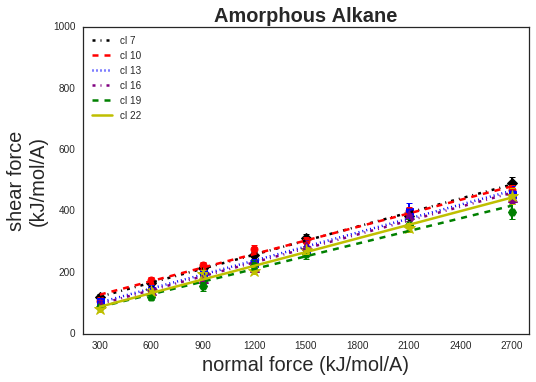

cl:  7, slope: 0.099, int:  98.726, r: 0.973, p: 0.000, std_err: 0.011
cl: 10, slope: 0.143, int:  66.570, r: 0.999, p: 0.000, std_err: 0.002
cl: 13, slope: 0.133, int:  92.042, r: 0.992, p: 0.000, std_err: 0.008
cl: 16, slope: 0.125, int:  85.945, r: 0.997, p: 0.000, std_err: 0.004
cl: 19, slope: 0.138, int:  71.959, r: 0.999, p: 0.000, std_err: 0.003
cl: 22, slope: 0.134, int:  72.368, r: 0.999, p: 0.000, std_err: 0.003


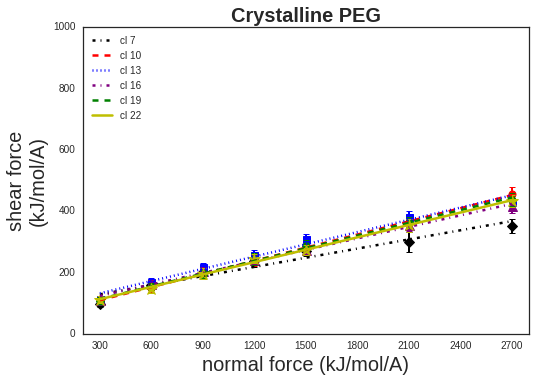

cl:  7, slope: 0.156, int: 100.013, r: 0.998, p: 0.000, std_err: 0.005
cl: 10, slope: 0.144, int: 112.199, r: 0.995, p: 0.000, std_err: 0.007
cl: 13, slope: 0.132, int: 113.230, r: 0.999, p: 0.000, std_err: 0.003
cl: 16, slope: 0.131, int: 108.542, r: 0.987, p: 0.000, std_err: 0.009
cl: 19, slope: 0.131, int: 108.640, r: 0.997, p: 0.000, std_err: 0.004
cl: 22, slope: 0.128, int: 115.351, r: 0.996, p: 0.000, std_err: 0.005


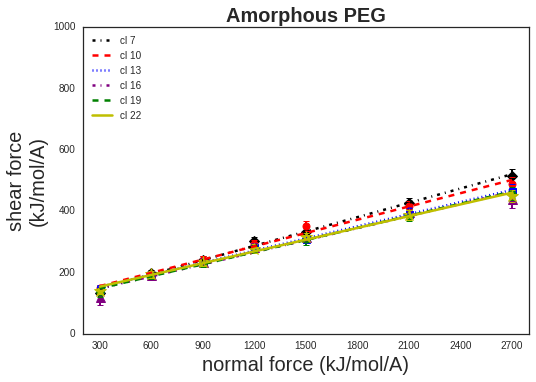

cl:  7, slope: 0.159, int: 272.075, r: 0.989, p: 0.000, std_err: 0.011
cl: 10, slope: 0.117, int: 285.780, r: 0.997, p: 0.000, std_err: 0.004
cl: 13, slope: 0.137, int: 286.427, r: 0.985, p: 0.000, std_err: 0.011
cl: 16, slope: 0.112, int: 299.670, r: 0.995, p: 0.000, std_err: 0.005
cl: 19, slope: 0.144, int: 252.482, r: 0.996, p: 0.000, std_err: 0.006
cl: 22, slope: 0.138, int: 257.352, r: 0.996, p: 0.000, std_err: 0.006


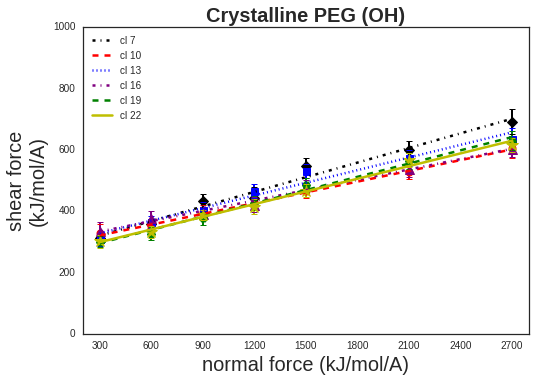

cl:  7, slope: 0.172, int: 243.536, r: 0.996, p: 0.000, std_err: 0.007
cl: 10, slope: 0.137, int: 268.107, r: 0.990, p: 0.000, std_err: 0.009
cl: 13, slope: 0.133, int: 277.845, r: 0.994, p: 0.000, std_err: 0.007
cl: 16, slope: 0.135, int: 285.342, r: 0.989, p: 0.000, std_err: 0.009
cl: 19, slope: 0.130, int: 292.310, r: 0.996, p: 0.000, std_err: 0.005
cl: 22, slope: 0.124, int: 303.652, r: 0.993, p: 0.000, std_err: 0.007


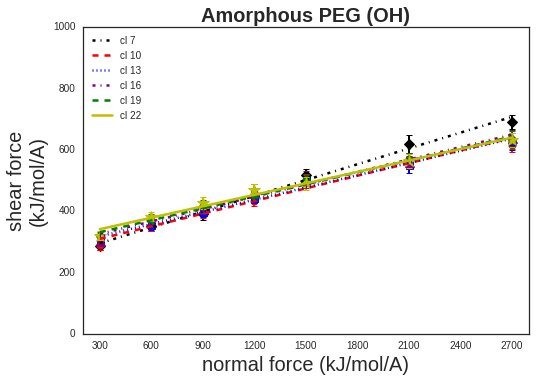

In [7]:
chain_lengths = np.array([7, 10, 13, 16, 19, 22])
cl_array_len = len(chain_lengths)
normal_forces = np.array([0300.0, 0600.0, 0900.0, 1200.0, 1500.0, 2100.0, 2700.0])
nf_array_len = len(normal_forces)

from scipy import stats
from pprint import pprint
import itertools as it

polymers = ["Alk", "Peg_", "PegO"]
surfaces = ["Betacristobalite", "SilicaInterface"]

seven = np.zeros(nf_array_len)
ten = np.zeros(nf_array_len)
thirteen = np.zeros(nf_array_len)
sixteen = np.zeros(nf_array_len)
nineteen = np.zeros(nf_array_len)
twentytwo = np.zeros(nf_array_len)
seven_err = np.zeros(nf_array_len)
ten_err = np.zeros(nf_array_len)
thirteen_err = np.zeros(nf_array_len)
sixteen_err = np.zeros(nf_array_len)
nineteen_err = np.zeros(nf_array_len)
twentytwo_err = np.zeros(nf_array_len)

lines = [seven, ten, thirteen, sixteen, nineteen, twentytwo]

for polymer, surface in it.product(polymers, surfaces):
    for i in range(nf_array_len):
        seven[i] = [x[7]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 7 in x.keys()][0]
        seven_err[i] = [x[7]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 7 in x.keys()][0]
        ten[i] = [x[10]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 10 in x.keys()][0]
        ten_err[i] = [x[10]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 10 in x.keys()][0]
        thirteen[i] = [x[13]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 13 in x.keys()][0]
        thirteen_err[i] = [x[13]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 13 in x.keys()][0]
        sixteen[i] = [x[16]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 16 in x.keys()][0]
        sixteen_err[i] = [x[16]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 16 in x.keys()][0]
        nineteen[i] = [x[19]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 19 in x.keys()][0]
        nineteen_err[i] = [x[19]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 19 in x.keys()][0]
        twentytwo[i] = [x[22]['shear_force'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 22 in x.keys()][0]
        twentytwo_err[i] = [x[22]['shear_force_std'] for n, x in cof.items() if polymer in n and surface in n and str(normal_forces[i]) in n and 22 in x.keys()][0]
        
    for i in range(len(normal_forces)):
        plt.errorbar(normal_forces[i], seven[i], yerr=seven_err[i], ls=':', elinewidth=2.0,
                     marker='D', ms=7.0, lw=2.5, c='k', mew=1, mec='k')
        plt.errorbar(normal_forces[i], ten[i], yerr=ten_err[i], ls='--', elinewidth=2.0,
                     marker='o', ms=7.0, lw=2.5, c='r', mew=1, mec='r')
        plt.errorbar(normal_forces[i], thirteen[i], yerr=thirteen_err[i], ls='-.', elinewidth=2.0,
                     marker='s', ms=7.0, lw=2.5, c='b', mew=1, mec='b')
        plt.errorbar(normal_forces[i], sixteen[i], yerr=sixteen_err[i], ls='-', elinewidth=2.0,
                     marker='^', ms=9.0, lw=2.5, c='purple', mew=1, mec='purple')
        plt.errorbar(normal_forces[i], nineteen[i], yerr=nineteen_err[i], ls='--', elinewidth=2.0,
                     marker='H', ms=8.0, lw=2.5, c='g', mew=1, mec='g')
        plt.errorbar(normal_forces[i], twentytwo[i], yerr=twentytwo_err[i], ls='-.', elinewidth=2.0,
                     marker='*', ms=12.0, lw=2.5, c='y', mew=1, mec='y')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, seven, 1))(normal_forces),
             ls='-.',  label='cl 7',lw=2.5, c='k')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, ten, 1))(normal_forces),
             ls='--',  label='cl 10',lw=2.5, c='r')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, thirteen, 1))(normal_forces),
             ls=':',  label='cl 13',lw=2.5, c='b')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, sixteen, 1))(normal_forces),
             ls='-.',  label='cl 16',lw=2.5, c='purple')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, nineteen, 1))(normal_forces),
             ls='--',  label='cl 19',lw=2.5, c='g')
    plt.plot(normal_forces, np.poly1d(np.polyfit(normal_forces, twentytwo, 1))(normal_forces),
             ls='-',  label='cl 22',lw=2.5, c='y')

    
    
    
    name = "{}_{}".format(polymer, surface)
    cof[name]=dict()
   
    for i in range(cl_array_len):
        slope, intercept, r_value, p_value, std_err = stats.linregress(normal_forces, lines[i])    
        cof[name][chain_lengths[i]] = [slope, std_err]
        print("cl:{5:3d}, slope:{0:>6.3f}, int:{1:>8.3f}, r:{2:>6.3f}, p:{3:>6.3f}, std_err:{4:>6.3f}".format(slope, intercept, r_value, p_value, std_err, chain_lengths[i]))
    
    if surface == "Betacristobalite":
        structure = 'Crystalline'
    else:
        structure = "Amorphous"
    if polymer == "Alk":
        polymer_name = "Alkane"
    elif polymer == "PegO":
        polymer_name = "PEG (OH)"
    else:
        polymer_name = "PEG"

    plt.xlabel('normal force (kJ/mol/A)', size=20)
    xticks=[300, 600, 900, 1200, 1500, 1800, 2100, 2400, 2700]
    plt.xticks(xticks)
    plt.xlim((200, 2800))
    
    plt.ylim((0, 1000))
    plt.ylabel('shear force\n(kJ/mol/A)', size=20)
    plt.legend(loc='upper left')
    
    plt.title("{} {}".format(structure, polymer_name), size=20, weight='bold')
    plt.show()
    plt.clf()

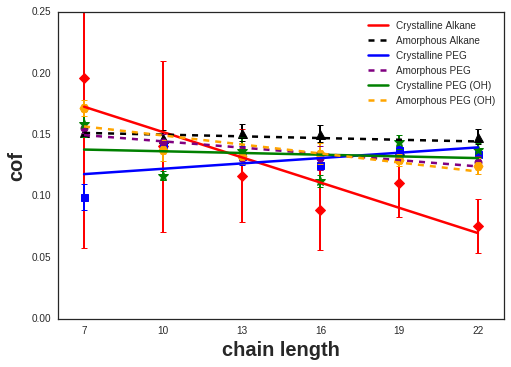

In [25]:


AC = np.zeros(cl_array_len)
AA = np.zeros(cl_array_len)
PC = np.zeros(cl_array_len)
PA = np.zeros(cl_array_len)
AC_err = np.zeros(cl_array_len)
AA_err = np.zeros(cl_array_len)
PC_err = np.zeros(cl_array_len)
PA_err = np.zeros(cl_array_len)
POC = np.zeros(cl_array_len)
POA = np.zeros(cl_array_len)
POC_err = np.zeros(cl_array_len)
POA_err = np.zeros(cl_array_len)

names = ["Alk_Betacristobalite", "Alk_SilicaInterface", "Peg__Betacristobalite", "Peg__SilicaInterface", "PegO_Betacristobalite", "PegO_SilicaInterface"]

for i in range(cl_array_len):
    AC[i] = cof[names[0]][chain_lengths[i]][0]
    AA[i] = cof[names[1]][chain_lengths[i]][0]
    PC[i] = cof[names[2]][chain_lengths[i]][0]
    PA[i] = cof[names[3]][chain_lengths[i]][0]
    POC[i] = cof[names[4]][chain_lengths[i]][0]
    POA[i] = cof[names[5]][chain_lengths[i]][0]
    AC_err[i] = cof[names[0]][chain_lengths[i]][1]
    AA_err[i] = cof[names[1]][chain_lengths[i]][1]
    PC_err[i] = cof[names[2]][chain_lengths[i]][1]
    PA_err[i] = cof[names[3]][chain_lengths[i]][1]
    POC_err[i] = cof[names[4]][chain_lengths[i]][1]
    POA_err[i] = cof[names[5]][chain_lengths[i]][1]
    
names = ["Crystalline Alkane", "Amorphous Alkane", "Crystalline PEG", "Amorphous PEG", "Crystalline PEG (OH)", "Amorphous PEG (OH)"]
     
for i in range(len(chain_lengths)):
    plt.errorbar(chain_lengths[i], AC[i], ls='--', yerr=AC_err[i], lw=2.5,
                 marker='D', ms=7, c='r', mew=1, mec='r', elinewidth=2.0)
    plt.errorbar(chain_lengths[i], AA[i], ls=':', yerr=AA_err[i], lw=2.5,
                 marker='^', ms=9, c='k', mew=1, mec='k', elinewidth=2.0)
    plt.errorbar(chain_lengths[i], PC[i], ls='-', yerr=PC_err[i], lw=2.5,
                 marker='s', ms=7, c='b', mew=1, mec='b', elinewidth=2.0)
    plt.errorbar(chain_lengths[i], PA[i], ls='-.', yerr=PA_err[i], lw=2.5,
                 marker='o', ms=7, c='purple', mew=1, mec='purple', elinewidth=2.0)
    plt.errorbar(chain_lengths[i], POC[i], ls='-.', yerr=POC_err[i], lw=2.5,
                 marker='*', ms=10, c='g', mew=1, mec='g', elinewidth=2.0)
    plt.errorbar(chain_lengths[i], POA[i], ls='--', yerr=POA_err[i], lw=2.5,
                 marker='H', ms=9, c='orange', mew=1, mec='orange', elinewidth=2.0)

plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, AC, 1))(chain_lengths),
         ls='-', label=names[0],lw=2.5, c='r')
plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, AA, 1))(chain_lengths),
         ls='--', label=names[1],lw=2.5, c='k')
plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, PC, 1))(chain_lengths),
         ls='-', label=names[2],lw=2.5, c='b')
plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, PA, 1))(chain_lengths),
         ls='--', label=names[3],lw=2.5, c='purple')
plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, POC, 1))(chain_lengths),
         ls='-', label=names[4],lw=2.5, c='g')
plt.plot(chain_lengths, np.poly1d(np.polyfit(chain_lengths, POA, 1))(chain_lengths),
         ls='--', label=names[5],lw=2.5, c='orange')

    
plt.xlabel('chain length', size=20, weight='bold')
plt.xticks(chain_lengths)
plt.xlim((6, 23))

plt.ylim((0, .25))
plt.ylabel('cof', size=20, weight='bold')
plt.legend(loc='upper right')

plt.show()
plt.clf()